# Helmet Mapping + Deepsort

In this notebook:
1. I introduce a package `helmet_assignment` which includes some helper code.
2. I show how `deepsort` can be applied to post process exsiting predictions.

Postprocessing is applied to the baseline predictions from [this amazing starter notebook](https://www.kaggle.com/its7171/nfl-baseline-simple-helmet-mapping).



# "helmet_assignment" package provides helper code.

This package includes helpful functions like`NFLAssignmentScorer`, `check_submission` and `add_track_features`.

- dataset: https://www.kaggle.com/robikscube/helmet-assignment-helpers
- github: https://github.com/RobMulla/helmet-assignment

In [1]:
# Install helmet-assignment helper code
!pip install ../input/nfl-helmet-helper/helmet-assignment-main > /dev/null 2>&1
from helmet_assignment.score import NFLAssignmentScorer, check_submission
from helmet_assignment.features import add_track_features
from helmet_assignment.utils import *

!pip install ../input/easyocr/EasyOCR-master > /dev/null 2>&1
import easyocr

# Baseline helmet mapping
This section uses the simple helmet mapping approach from the awesome notebook:

https://www.kaggle.com/its7171/nfl-baseline-simple-helmet-mapping

In [2]:
import numpy as np
import pandas as pd
import itertools
import glob
import os
import cv2
from sklearn.metrics import accuracy_score
from tqdm.auto import tqdm
from multiprocessing import Pool
from matplotlib import pyplot as plt
from sklearn.cluster import KMeans
import random
pd.set_option('mode.chained_assignment', None)

## Settings and loading data

Note I've extracted `max_iter`, `DIG_STEP` and `DIG_MAX` to the top for easy experimentation. I've also modified the code to run in debug mode if running on the public test set.

In [3]:
n_test_videos = len(os.listdir('../input/nfl-health-and-safety-helmet-assignment/test/'))
# Run in debug mode unless during submission
if n_test_videos == 6:
    debug = True
else:
    debug = False

# Configurables
n_debug_samples = 1
random_state = 42
CONF_THRE_SIDE = 0.25
CONF_THRE_END = 0.41
max_iter = 750
DIG_STEP = 3
DIG_MAX = DIG_STEP*10
IMG_HEIGHT = 720
IMG_WIDTH = 1280
# Read in the data.

BASE_DIR = '../input/nfl-health-and-safety-helmet-assignment'
OCR_MODEL_DIR = '../input/easyocr/ocr_model'
tmp_dir = './temp'
os.makedirs(tmp_dir, exist_ok=True)
sample_frame_path = 'frame.png'


labels = pd.read_csv(f'{BASE_DIR}/train_labels.csv')
if debug:
    tracking = pd.read_csv(f'{BASE_DIR}/train_player_tracking.csv')
    helmets = pd.read_csv(f'{BASE_DIR}/train_baseline_helmets.csv')
    VIDEO_DIR = BASE_DIR + '/train/'
else:
    tracking = pd.read_csv(f'{BASE_DIR}/test_player_tracking.csv')
    helmets = pd.read_csv(f'{BASE_DIR}/test_baseline_helmets.csv')
    VIDEO_DIR = BASE_DIR + '/test/'
    
tracking = add_track_features(tracking)

In [4]:
def add_cols(df):
    df['game_play'] = df['video_frame'].str.split('_').str[:2].str.join('_')
    if 'video' not in df.columns:
        df['video'] = df['video_frame'].str.split('_').str[:3].str.join('_') + '.mp4'
    if 'playID' not in df.columns:
        df['playID'] = df['video'].str.split('_').str[1]
    if 'gameKey' not in df.columns:
        df['gameKey'] = df['game_play'].str.split('_').str[0]
    return df

helmets = add_cols(helmets)
if debug:
    labels = add_cols(labels)
    print(len(labels))

952087


In [5]:
helmets.head()

,video_frame,left,width,top,height,conf,game_play,video,playID,gameKey
0,57778_004244_Endzone_1,598,18,278,18,0.080017,57778_004244,57778_004244_Endzone.mp4,004244,57778
1,57778_004244_Endzone_1,856,16,294,22,0.089050,57778_004244,57778_004244_Endzone.mp4,004244,57778
2,57778_004244_Endzone_1,314,21,262,26,0.153076,57778_004244,57778_004244_Endzone.mp4,004244,57778
3,57778_004244_Endzone_1,304,21,280,20,0.821289,57778_004244,57778_004244_Endzone.mp4,004244,57778
4,57778_004244_Endzone_1,585,19,290,19,0.828613,57778_004244,57778_004244_Endzone.mp4,004244,57778


In [6]:
tracking.head()

,gameKey,playID,player,time,x,y,s,a,dis,o,dir,event,game_play,snap,isSnap,team,snap_offset,est_frame
0,57583,82,H97,2018-09-14 00:23:45.500000+00:00,38.89,28.06,0.0,0.0,0.0,261.28,222.79,NaN,57583_000082,2018-09-14 00:24:00.200000+00:00,False,Home,-14.700,-871
1,57583,82,H97,2018-09-14 00:23:45.599000+00:00,38.89,28.06,0.0,0.0,0.0,261.28,221.93,NaN,57583_000082,2018-09-14 00:24:00.200000+00:00,False,Home,-14.601,-865
2,57583,82,H97,2018-09-14 00:23:45.700000+00:00,38.89,28.06,0.0,0.0,0.0,261.28,221.21,NaN,57583_000082,2018-09-14 00:24:00.200000+00:00,False,Home,-14.500,-859
3,57583,82,H97,2018-09-14 00:23:45.799000+00:00,38.88,28.05,0.0,0.0,0.0,261.28,220.07,NaN,57583_000082,2018-09-14 00:24:00.200000+00:00,False,Home,-14.401,-853
4,57583,82,H97,2018-09-14 00:23:45.900000+00:00,38.88,28.05,0.0,0.0,0.0,261.28,220.31,NaN,57583_000082,2018-09-14 00:24:00.200000+00:00,False,Home,-14.300,-847


# Camera position prediction

In [7]:
import os
from tqdm.auto import tqdm
import cv2
import pandas as pd
from PIL import Image

def crop_img_edge(tgt_helmet_df, tgt_ngs_df, crop_dist = 40, crop_max_iter = 4):
    '''
    crop the helmets at the edges of the image, aiming at cropping the outside players and audience
    '''
    tgt_imgh, tgt_imgw = 720, 1280

    i = 1  # crop counter
    while len(tgt_helmet_df) > len(tgt_ngs_df):
        if i > crop_max_iter:
            break
        
        # pre compute the limits of the frame
        y_upper_limit = tgt_imgh - crop_dist * i
        y_bottom_limit = crop_dist * i
        x_upper_limit = tgt_imgw - crop_dist * i
        x_bottom_limit = crop_dist * i
        
        tmp_helmet_df = tgt_helmet_df.copy()
        drop_idxs = []
        for j in range(len(tgt_helmet_df)):
            tmp_x = tmp_helmet_df['center_x_orig'].iloc[j]
            tmp_y = tmp_helmet_df['center_y_orig'].iloc[j]
            # if any player is in the limit area, then crop!
            if (tmp_x < x_bottom_limit) or (tmp_x > x_upper_limit) or (tmp_y < y_bottom_limit) or (tmp_y > y_upper_limit):
                tmp_idx = tgt_helmet_df.index[j]
                drop_idxs.append(tmp_idx)
        
        tmp_helmet_df.drop(drop_idxs, inplace = True)
        tgt_helmet_df = tmp_helmet_df.copy()
        i += 1 
    
    return tgt_helmet_df

def camera_postion_sideline(VIDEO_DIR: str,   # directory of videos
        tgt_vname: str,  # target video name
        tgt_frame: int,  # frame of the target video name
        sideline_loc_dict: dict,  # writable sideline loc dictionary
        helmet_df: pd.DataFrame,   # helmet dataframe
        ngs_df: pd.DataFrame,  # tracks ngs dataframe
        CONF_THRESH_SIDE: float  # confidence threshold of sideline
        ):
    # Target Video: obtain the targeted game info
    tgt_vpath = VIDEO_DIR + tgt_vname + '.mp4'

    tgt_helmet_df = helmet_df[helmet_df['video_frame'] == tgt_vname + '_{}'.format(tgt_frame)]
    tgt_gamekey = int(tgt_helmet_df['gameKey'].values[0])
    tgt_playid = int(tgt_helmet_df['playID'].values[0])
    tgt_ngs_df = ngs_df[(ngs_df['gameKey'] == tgt_gamekey) & (ngs_df['playID'] == tgt_playid)]

    # Target Frame: given a Helmet frame. find the nearest frame in NGS
    est_frame = find_nearest(tgt_ngs_df['est_frame'].values, tgt_frame)
    tgt_ngs_df = tgt_ngs_df[tgt_ngs_df['est_frame'] == est_frame]

    # filter out the box with low confidence
    tgt_helmet_df = tgt_helmet_df[tgt_helmet_df['conf'] > CONF_THRESH_SIDE]

    # Load the target frame into an image
    cap = cv2.VideoCapture(tgt_vpath)
    cap.set(cv2.CAP_PROP_POS_FRAMES, int(tgt_frame) - 1) # optional, frame is 0-based indexed
    success, image = cap.read()
    tgt_imgw = image.shape[1]
    tgt_imgh = image.shape[0]

    # define the helmet location
    # rotate the coordinate with 180 degree
    tgt_helmet_df['center_x_rotate'] = tgt_imgw - (tgt_helmet_df['left'] + tgt_helmet_df['width']/2).astype(int)
    tgt_helmet_df['center_y_rotate'] = tgt_imgh - (tgt_helmet_df['left'] + tgt_helmet_df['width']/2).astype(int)
    # keep the original coordinate
    tgt_helmet_df['center_x_orig'] = (tgt_helmet_df['left'] + tgt_helmet_df['width']/2).astype(int) # helmet CENTER position of x axis
    tgt_helmet_df['center_y_orig'] = (tgt_helmet_df['top'] + tgt_helmet_df['height']/2).astype(int) # helmet CENTER position of y axis
  
    # crop
    if len(tgt_helmet_df) > len(tgt_ngs_df) and len(tgt_helmet_df) > 30:
        tgt_helmet_df = crop_img_edge(tgt_helmet_df, tgt_ngs_df, crop_dist = 40, crop_max_iter = 4)

    if len(tgt_helmet_df) > len(tgt_ngs_df):
        tgt_helmet_df = tgt_helmet_df.tail(len(tgt_ngs_df))

    # rotate the ngs and compute the distance between video and roated ngs
    tgt_helmet_df_orig = tgt_helmet_df.sort_values('center_x_orig') 
    center_x_orig = tgt_helmet_df_orig['center_x_orig'].values
    min_dist_orig, min_detete_idx_orig = dist_rot(tgt_ngs_df, center_x_orig)
    tgt_helmet_df_rotate = tgt_helmet_df.sort_values('center_x_rotate') 
    center_x_rotate = tgt_helmet_df_rotate['center_x_rotate'].values
    min_dist_rotate, min_detete_idx_rotate = dist_rot(tgt_ngs_df, center_x_rotate)    

    # choose the camera side
    if min_dist_orig <= min_dist_rotate:
        sideline_loc_dict[tgt_vname] = 0
    else:
        sideline_loc_dict[tgt_vname] = 1


def find_nearest(array, value):
    value = int(value)
    array = np.asarray(array).astype(int)
    idx = (np.abs(array - value)).argmin()
    return array[idx]


def get_frame_from_video(frame, video, out_path='./frame.png'):
    video_path = video
    frame = frame - 1

    cmd = 'ffmpeg -hide_banner -loglevel fatal -nostats -i {} -vf "select=eq(n\,{})" -vframes 1 {}'.format(video, frame, out_path)
    os.system(cmd)
    img = Image.open(out_path)
    os.remove(out_path)
    return img


def camera_position_endview(
    VIDEO_DIR,
    video,
    tracking,
    helmets,
    CONF_THRE_END,
    endview_loc_dict,
    reader,
    sample_frame_path='frame.png',
    view='Endzone'):

    # recognize the player number with ocr, if no legal number is recogized at $try_frame, try recogizing the next $try_frame
    # match the recognized number position with tracking dataframe, if the position is back, demonstrating the player is at the right
    # of the field
    try_frame = 1
    if video.endswith('.mp4'):
        video_with_extension = video
        tgt_vname = video.rstrp('.mp4')
    else:
        video_with_extension = video + '.mp4'
        tgt_vname = video

    video_path = os.path.join(VIDEO_DIR, video_with_extension)
    
    gameKey, playID, _ = tgt_vname.split('_')
    game_play = gameKey + '_' + playID
    sample_tracking = tracking[tracking['game_play'] == game_play]
    sample_helmet = helmets[helmets['video'] == video_with_extension]
    pos = None
    
    # if $try_frame is too large, the positions of players will be uncontrollable
    while try_frame <= 100:
        video_frame = tgt_vname + '_{}'.format(try_frame)
        gameKey = int(gameKey)
        playID = int(playID)
        frame = int(try_frame)

        df = sample_helmet[sample_helmet['video_frame'] == video_frame]
        if len(df) == 0:
            break
        this_tracking = sample_tracking[(sample_tracking['gameKey']==gameKey) & (sample_tracking['playID']==playID)]
        est_frame = find_nearest(this_tracking.est_frame.values, frame)
        this_tracking = this_tracking[this_tracking['est_frame']==est_frame]
        len_this_tracking = len(this_tracking)

        if len_this_tracking == 0:
            break
        
        df['center_h_p'] = (df['left']+df['width']/2).astype(int)
        df['center_h_m'] = (df['left']+df['width']/2).astype(int)*-1

        df['center_x_rotate'] = 1280 - (df['left'] + df['width']/2).astype(int)
        df['center_y_rotate'] = 720 - (df['left'] + df['width']/2).astype(int)
        # keep the original coordinate
        df['center_x_orig'] = (df['left'] + df['width']/2).astype(int) # helmet CENTER position of x axis
        df['center_y_orig'] = (df['top'] + df['height']/2).astype(int) # helmet CENTER position of y axis

        if view == 'Endzone':
            df = df[df['conf']>CONF_THRE_END].copy()
    
        if len(df) > len_this_tracking and len(df) > 30:
            df = crop_img_edge(df.copy(),this_tracking)

        if len(df) > len_this_tracking:
            df = df.tail(len_this_tracking)
        
        frame_end = get_frame_from_video(frame=try_frame, video=video_path, out_path=sample_frame_path)
        frame_end = np.asarray(frame_end, dtype=np.uint8)

        results = reader.readtext(frame_end, detail=1)
        res = set()
        for result in results:
            # result: [[[left top x, y], [right top x, y], [right bottom x, y], [left bottom x, y]], text, conf]
            conf = result[-1]
            if conf < 0.2 or result[0][0][1] < 300: continue

            text = result[1].replace(' ', '')
            if text.isnumeric():
                res.add(text)
        
        this_sorted_tracking_players = this_tracking.sort_values('x')['player'].values
        pos = set()
        for t in res:
            for i, player in enumerate(this_sorted_tracking_players):
                if t in player:
                    pos.add(i+1)
                    break
        if len(pos) > 0:
            break
        try_frame += 30

    if pos is None or len(pos) == 0:
        endview_loc_dict[tgt_vname] = None
    elif sum(pos) > len(pos) * len(this_sorted_tracking_players) // 2:
        endview_loc_dict[tgt_vname] = 'R'
    else:
        endview_loc_dict[tgt_vname] = 'L'


def camera_position(VIDEO_DIR, helmet_df, ngs_df, CONF_THRESH_SIDE, CONF_THRESH_END, reader, out_frame_path='frame.png'):
    vnames = os.listdir(VIDEO_DIR)
    vnames = [v[:-4] for v in vnames]
    tgt_frame  = '1' # choose the first frame to decide the location of the camera

    sideline_loc_dict = {} # save the sideline camera's location
    endview_loc_dict = {}

    for tgt_vname in tqdm(vnames):
        # Sideline
        if tgt_vname.find('Sideline') != -1:
            camera_postion_sideline(VIDEO_DIR, tgt_vname, tgt_frame, sideline_loc_dict, helmet_df, ngs_df, CONF_THRESH_SIDE)
        
        # EndView
        else:
            camera_position_endview(VIDEO_DIR, tgt_vname, ngs_df, helmet_df, CONF_THRESH_END, endview_loc_dict, reader, sample_frame_path=out_frame_path)

    return sideline_loc_dict, endview_loc_dict

In [8]:
reader = easyocr.Reader(['en'], model_storage_directory=OCR_MODEL_DIR) # OCR model

sideline_loc_dict, endview_loc_dict = camera_position(VIDEO_DIR, helmet_df=helmets.copy(), ngs_df=tracking.copy(), \
    CONF_THRESH_SIDE=CONF_THRE_SIDE, CONF_THRESH_END=CONF_THRE_END, reader=reader, out_frame_path=sample_frame_path)

print(sideline_loc_dict, len(sideline_loc_dict))
print(endview_loc_dict, len(endview_loc_dict))


100%|██████████| 120/120 [00:41<00:00,  2.89it/s]

{'57583_000082_Sideline': 0, '57584_000336_Sideline': 1, '57584_002674_Sideline': 1, '57586_000540_Sideline': 0, '57586_001934_Sideline': 0, '57586_004152_Sideline': 0, '57594_000923_Sideline': 0, '57596_002686_Sideline': 0, '57597_000658_Sideline': 0, '57597_001242_Sideline': 0, '57676_003572_Sideline': 0, '57679_003316_Sideline': 0, '57680_002206_Sideline': 0, '57680_003470_Sideline': 0, '57684_001985_Sideline': 0, '57686_002546_Sideline': 0, '57700_001264_Sideline': 0, '57775_000933_Sideline': 0, '57778_004244_Sideline': 1, '57781_000252_Sideline': 0, '57782_000600_Sideline': 0, '57783_003374_Sideline': 0, '57784_001741_Sideline': 0, '57785_002026_Sideline': 0, '57786_003085_Sideline': 1, '57787_003413_Sideline': 0, '57788_000781_Sideline': 0, '57790_002792_Sideline': 0, '57682_002630_Sideline': 0, '57790_002839_Sideline': 0, '57997_003691_Sideline': 0, '57904_001367_Sideline': 0, '57905_002404_Sideline': 0, '57906_000718_Sideline': 1, '57907_003615_Sideline': 0, '57910_001164_Sidel

In [9]:
if debug:
    # Select `n_debug_samples` worth of videos to debug with
    sample_videos = labels['video'].drop_duplicates().sample(n_debug_samples, random_state=random_state).tolist()
#     sample_videos = ['57783_003374_Sideline.mp4']
    sample_gameplays = ['_'.join(x.split('_')[:2]) for x in sample_videos]
    tracking = tracking[tracking['game_play'].isin(sample_gameplays)]
    helmets = helmets[helmets['video'].isin(sample_videos)]
    labels = labels[labels['video'].isin(sample_videos)]
    
tracking.shape, helmets.shape

((6424, 18), (8746, 10))

In [10]:
def find_nearest(array, value):
    value = int(value)
    array = np.asarray(array).astype(int)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

def norm_arr(a):
    a = a-a.min()
    a = a/a.max()
    return a
    
def dist(a1, a2):
    return np.linalg.norm(a1-a2)

def dist_for_different_len(a1, a2):
    assert len(a1) >= len(a2), f'{len(a1)}, {len(a2)}'
    len_diff = len(a1) - len(a2)
    a2 = norm_arr(a2)
    if len_diff == 0:
        a1 = norm_arr(a1)
        return dist(a1,a2), ()
    else:
        min_dist = 10000
        min_detete_idx = None
        cnt = 0
        del_list = list(itertools.combinations(range(len(a1)),len_diff))
        if len(del_list) > max_iter:
            del_list = random.sample(del_list, max_iter)
        for detete_idx in del_list:
            this_a1 = np.delete(a1, detete_idx)
            this_a1 = norm_arr(this_a1)
            this_dist = dist(this_a1, a2)
            if min_dist > this_dist:
                min_dist = this_dist
                min_detete_idx = detete_idx
                
        return min_dist, min_detete_idx
        
def rotate_arr(u, t, deg=True):
    if deg == True:
        t = np.deg2rad(t)
    R = np.array([[np.cos(t), -np.sin(t)],
                  [np.sin(t),  np.cos(t)]])
    return  np.dot(R, u)

def dist_rot_x(tracking_df, a2):
    tracking_df = tracking_df.sort_values('x')
    x = tracking_df['x']
    y = tracking_df['y']
    min_dist = 10000
    min_idx = None
    min_x = None
    for dig in range(-DIG_MAX,DIG_MAX+1,DIG_STEP):
        arr = rotate_arr(np.array((x,y)), dig)
        this_dist, this_idx = dist_for_different_len(np.sort(arr[0]), a2)
        if min_dist > this_dist:
            min_dist = this_dist
            min_idx = this_idx
            min_x = arr[0]
    tracking_df['x_rot'] = min_x
    player_arr = tracking_df.sort_values('x_rot')['player'].values
    players = np.delete(player_arr,min_idx)
    return min_dist, players

def dist_rot_y(tracking_df, a2):
    tracking_df = tracking_df.sort_values('y')
    x = tracking_df['x']
    y = tracking_df['y']
    min_dist = 10000
    min_idx = None
    min_x = None
    for dig in range(-DIG_MAX,DIG_MAX+1,DIG_STEP):
        arr = rotate_arr(np.array((x,y)), dig)
        this_dist, this_idx = dist_for_different_len(np.sort(arr[1]), a2)
        if min_dist > this_dist:
            min_dist = this_dist
            min_idx = this_idx
            min_y = arr[1]
    tracking_df['y_rot'] = min_y
    player_arr = tracking_df.sort_values('y_rot')['player'].values
    players = np.delete(player_arr,min_idx)
    return min_dist, players


def mapping_df(args):
    video_frame, df = args
    gameKey,playID,view,frame = video_frame.split('_')
    # need for camera prediction
    video_name = gameKey + '_' + playID + '_' + view
    gameKey = int(gameKey)
    playID = int(playID)
    frame = int(frame)
    this_tracking = tracking[(tracking['gameKey']==gameKey) & (tracking['playID']==playID)]
    est_frame = find_nearest(this_tracking.est_frame.values, frame)
    this_tracking = this_tracking[this_tracking['est_frame']==est_frame]
    len_this_tracking = len(this_tracking)
    df['center_h_p'] = (df['left']+df['width']/2).astype(int)
    df['center_h_m'] = (df['left']+df['width']/2).astype(int)*-1
    
    df['center_v_p'] = IMG_HEIGHT - (df['top']+df['height']/2).astype(int)
    df['center_v_m'] = (IMG_HEIGHT - (df['top']+df['height']/2).astype(int))*-1
    
    if view == 'Endzone':
        df = df[df['conf']>CONF_THRE_END].copy()
    else:
        df = df[df['conf']>CONF_THRE_SIDE].copy()

    df['center_x_rotate'] = 1280 - (df['left'] + df['width']/2).astype(int)
    df['center_y_rotate'] = 720 - (df['left'] + df['width']/2).astype(int)
    # keep the original coordinate
    df['center_x_orig'] = (df['left'] + df['width']/2).astype(int) # helmet CENTER position of x axis
    df['center_y_orig'] = (df['top'] + df['height']/2).astype(int) # helmet CENTER position of y axis

    # cut out not inside the match   
    if len(df) > len_this_tracking and len(df) > 30:
        df = crop_img_edge(df.copy(),this_tracking)

    if len(df) > len_this_tracking:
        df = df.tail(len_this_tracking)

    df_h_p = df.sort_values('center_h_p').copy()
    df_h_m = df.sort_values('center_h_m').copy()
    
    df_v_p = df.sort_values('center_v_p').copy()
    df_v_m = df.sort_values('center_v_m').copy()
    
    if view == 'Endzone':
        this_tracking['x'], this_tracking['y'] = this_tracking['y'].copy(), this_tracking['x'].copy()
    a2_h_p = df_h_p['center_h_p'].values
    a2_h_m = df_h_m['center_h_m'].values
    
    a2_v_p = df_v_p['center_v_p'].values
    a2_v_m = df_v_m['center_v_m'].values
    ######################## new code ########################
    # first mapping based on x
    if view == 'Endzone':   #same as before
        if endview_loc_dict[video_name] =='R':
            min_dist_p, min_detete_idx_p = dist_rot_x(this_tracking ,a2_h_p)
            min_dist = min_dist_p
            min_detete_idx = min_detete_idx_p
            tgt_df = df_h_p
        elif endview_loc_dict[video_name] =='L':
            min_dist_m, min_detete_idx_m = dist_rot_x(this_tracking ,a2_h_m)
            min_dist = min_dist_m
            min_detete_idx = min_detete_idx_m
            tgt_df = df_h_m
        else:
            min_dist_p, min_detete_idx_p = dist_rot_x(this_tracking ,a2_h_p)
            min_dist_m, min_detete_idx_m = dist_rot_x(this_tracking ,a2_h_m)
            if min_dist_p < min_dist_m:
                min_dist = min_dist_p
                min_detete_idx = min_detete_idx_p
                tgt_df = df_h_p
            else:
                min_dist = min_dist_m
                min_detete_idx = min_detete_idx_m
                tgt_df = df_h_m
    else:                   # using the camera prediciton here
        if sideline_loc_dict[video_name] == 0:
            min_dist_p, min_detete_idx_p = dist_rot_x(this_tracking ,a2_h_p)
            min_dist = min_dist_p
            min_detete_idx = min_detete_idx_p
            tgt_df = df_h_p
        else:
            min_dist_m, min_detete_idx_m = dist_rot_x(this_tracking ,a2_h_m)
            min_dist = min_dist_m
            min_detete_idx = min_detete_idx_m
            tgt_df = df_h_m
    #storing the result from x
    
    min_dist_x = min_dist
    min_detete_idx_x = min_detete_idx
    tgt_df_x = tgt_df
    
    ######################## new code ########################
    # then mapping based on y
    if view == 'Endzone':   #same as before
        if endview_loc_dict[video_name] =='L':
            min_dist_p, min_detete_idx_p = dist_rot_y(this_tracking ,a2_v_p)
            min_dist = min_dist_p
            min_detete_idx = min_detete_idx_p
            tgt_df = df_v_p
        elif endview_loc_dict[video_name] =='R':
            min_dist_m, min_detete_idx_m = dist_rot_y(this_tracking ,a2_v_m)
            min_dist = min_dist_m
            min_detete_idx = min_detete_idx_m
            tgt_df = df_v_m
        else:
            min_dist_p, min_detete_idx_p = dist_rot_y(this_tracking ,a2_v_p)
            min_dist_m, min_detete_idx_m = dist_rot_y(this_tracking ,a2_v_m)
            if min_dist_p < min_dist_m:
                min_dist = min_dist_p
                min_detete_idx = min_detete_idx_p
                tgt_df = df_v_p
            else:
                min_dist = min_dist_m
                min_detete_idx = min_detete_idx_m
                tgt_df = df_v_m
    else:                   # using the camera prediciton here
        if sideline_loc_dict[video_name] == 0:
            min_dist_p, min_detete_idx_p = dist_rot_y(this_tracking ,a2_v_p)
            min_dist = min_dist_p
            min_detete_idx = min_detete_idx_p
            tgt_df = df_v_p
        else:
            min_dist_m, min_detete_idx_m = dist_rot_y(this_tracking ,a2_v_m)
            min_dist = min_dist_m
            min_detete_idx = min_detete_idx_m
            tgt_df = df_v_m
    #storing the result from y
    
    min_dist_y = min_dist
    min_detete_idx_y = min_detete_idx
    tgt_df_y = tgt_df
    
    # take the better value from x or y mapping
    if min_dist_x <= min_dist_y:
        tgt_df = tgt_df_x
        min_detete_idx = min_detete_idx_x
    else:
        tgt_df = tgt_df_y
        min_detete_idx = min_detete_idx_y
    
    tgt_df['label'] = min_detete_idx
    return tgt_df[['video_frame','left','width','top','height','label']]

p = Pool(processes=8)
submission_df_list = []
df_list = list(helmets.groupby('video_frame'))
with tqdm(total=len(df_list)) as pbar:
    for this_df in p.imap(mapping_df, df_list):
        submission_df_list.append(this_df)
        pbar.update(1)
p.close()

submission_df = pd.concat(submission_df_list)
submission_df.to_csv('submission-baseline.csv', index=False)

100%|██████████| 451/451 [01:37<00:00,  4.61it/s]


## Score the predictions before applying deepsort postprocessing

The scores are roughly ~0.3, which is similar to the public leaderboard.

In [11]:
if debug:
    scorer = NFLAssignmentScorer(labels)
    baseline_score = scorer.score(submission_df)
    print(f"validation score {baseline_score:0.4f}")

validation score 0.3683


# Deepsort Postprocessing

Deepsort is a popular framework for object tracking within video. 
- [This blog post](https://nanonets.com/blog/object-tracking-deepsort/
) shows some examples of it being put to use.
- This notebook shows how to apply deepsort to this helmet dataset: https://www.kaggle.com/s903124/nfl-helmet-with-yolov5-deepsort-starter
- You can also read the paper for deepsort here: https://arxiv.org/pdf/1703.07402.pdf

The approach is fairly simple:
1. Step through each frame in a video and apply the deepsort algorithm. This clusters helmets across frames when it is the same player/helmet.
2. Group by each of these deepsort clusters - and pick the most common label for that cluster. Then override all of the predictions for that helmet to the same player.

## Importing Deepsort from dataset
Because your submission is not allowed to use internet access, you can reference the deepsort codebase from the attached dataset. Deepsort also has a dependency of `easydict` which I've also added as a dataset.

In [12]:
import sys
# sys.path.append('../input/easydict-master/easydict-master/')
# https://github.com/mikel-brostrom/Yolov5_DeepSort_Pytorch
sys.path.append('../input/Yolov5_DeepSort_10_02/deep_sort_pytorch/')
from deep_sort.deep_sort import DeepSort
from utils.parser import get_config
from deep_sort.sort.iou_matching import iou

## Deepsort config

Deepsort uses a config yaml file for some settings. These are just the default configs and could be improved.

## use different deepsort configs on different views, and two deepsorts are applied on helmets and players, fuse the result

In [13]:
%%writefile deepsort_player_sideview.yaml

DEEPSORT:
  REID_CKPT: "../input/yolov5-deepsort-pytorch/ckpt.t7"
  MAX_DIST: 0.2
  MIN_CONFIDENCE: 0.3
  NMS_MAX_OVERLAP: 0.5
  MAX_IOU_DISTANCE: 0.65
  MAX_AGE: 15
  N_INIT: 1
  NN_BUDGET: 30
# BYTETRACK:
#   track_thresh: 0.3
#   track_buffer: 50
#   match_thresh: 0.7
#   min_box_area: 1
#   mot20: False

Writing deepsort_player_sideview.yaml


In [14]:
%%writefile deepsort_helmet_sideview.yaml

DEEPSORT:
  #REID_CKPT: "./checkpoint/helmet_ckpt_30.t7"
  #REID_CKPT: "./checkpoint/helmet_ckpt_80.t7"
  REID_CKPT: "../input/yolov5-deepsort-pytorch/ckpt.t7"
  MAX_DIST: 0.2
  MIN_CONFIDENCE: 0.3
  NMS_MAX_OVERLAP: 0.5
  MAX_IOU_DISTANCE: 0.9
  MAX_AGE: 20
  N_INIT: 1
  NN_BUDGET: 30
# BYTETRACK:
#   track_thresh: 0.3
#   track_buffer: 50
#   match_thresh: 0.7
#   min_box_area: 1
#   mot20: False

Writing deepsort_helmet_sideview.yaml


In [15]:
%%writefile deepsort_player_endview.yaml

DEEPSORT:
  #REID_CKPT: "./checkpoint/helmet_ckpt_30.t7"
  #REID_CKPT: "./checkpoint/helmet_ckpt_80.t7"
  REID_CKPT: "../input/yolov5-deepsort-pytorch/ckpt.t7"
  MAX_DIST: 0.2
  MIN_CONFIDENCE: 0.3
  NMS_MAX_OVERLAP: 0.5
  MAX_IOU_DISTANCE: 0.65
  MAX_AGE: 15
  N_INIT: 1
  NN_BUDGET: 30
# BYTETRACK:
#   track_thresh: 0.3
#   track_buffer: 50
#   match_thresh: 0.7
#   min_box_area: 1
#   mot20: False

Writing deepsort_player_endview.yaml


In [16]:
%%writefile deepsort_helmet_endview.yaml

DEEPSORT:
  #REID_CKPT: "./checkpoint/helmet_ckpt_30.t7"
  #REID_CKPT: "./checkpoint/helmet_ckpt_80.t7"
  REID_CKPT: "../input/yolov5-deepsort-pytorch/ckpt.t7"
  MAX_DIST: 0.2
  MIN_CONFIDENCE: 0.3
  NMS_MAX_OVERLAP: 0.5
  MAX_IOU_DISTANCE: 0.9
  MAX_AGE: 20
  N_INIT: 1
  NN_BUDGET: 30
# BYTETRACK:
#   track_thresh: 0.3
#   track_buffer: 50
#   match_thresh: 0.9
#   min_box_area: 1
#   mot20: False


Writing deepsort_helmet_endview.yaml


In [18]:
"""
Helper functions from yolov5 to plot deepsort labels.
"""

def compute_color_for_id(label):
    """
    Simple function that adds fixed color depending on the id
    """
    palette = (2 ** 11 - 1, 2 ** 15 - 1, 2 ** 20 - 1)

    color = [int((p * (label ** 2 - label + 1)) % 255) for p in palette]
    return tuple(color)

def plot_one_box(x, im, color=None, label=None, line_thickness=3):
    # Plots one bounding box on image 'im' using OpenCV
    assert im.data.contiguous, 'Image not contiguous. Apply np.ascontiguousarray(im) to plot_on_box() input image.'
    tl = line_thickness or round(0.002 * (im.shape[0] + im.shape[1]) / 2) + 1  # line/font thickness
    color = color or [random.randint(0, 255) for _ in range(3)]
    c1, c2 = (int(x[0]), int(x[1])), (int(x[2]), int(x[3]))
    cv2.rectangle(im, c1, c2, color, thickness=tl, lineType=cv2.LINE_AA)
    if label: 
        tf = max(tl - 1, 1)  # font thickness
        t_size = cv2.getTextSize(label, 0, fontScale=tl / 3, thickness=tf)[0]
        c2 = c1[0] + t_size[0], c1[1] - t_size[1] - 3
        cv2.rectangle(im, c1, c2, color, -1, cv2.LINE_AA)  # filled
        cv2.putText(im, label, (c1[0], c1[1] - 2), 0, tl / 3, [225, 255, 255], thickness=tf, lineType=cv2.LINE_AA)
    return im

## Functions to apply deepsort to helmet boxes.

Below are two functions `deepsort_helmets` which runs deepsort across a video. There is a lot of room for improving this function. The merging of deepsort labels onto the original helmet boxes is currently done in a very crude manner.

`add_deepsort_label_col` mapps the most common label to each deepsort cluster.

In [25]:
from PIL import Image
import shutil
def deepsort(video_data,
            video_dir,
            view='Sideline',
            plot=False,
            plot_frames=[]):
    
    # Setup Deepsort
    if view == 'Sideline':
        cfg_helmet = get_config()
        cfg_helmet.merge_from_file('deepsort_helmet_sideview.yaml')
        
        cfg_player = get_config()
        cfg_player.merge_from_file('deepsort_player_sideview.yaml')
    else:
        cfg_helmet = get_config()
        cfg_helmet.merge_from_file('deepsort_helmet_endview.yaml')
        
        cfg_player = get_config()
        cfg_player.merge_from_file('deepsort_player_endview.yaml')

    deepsort_helmet = DeepSort(cfg_helmet.DEEPSORT.REID_CKPT,
                        max_dist=cfg_helmet.DEEPSORT.MAX_DIST,
                        min_confidence=cfg_helmet.DEEPSORT.MIN_CONFIDENCE,
                        nms_max_overlap=cfg_helmet.DEEPSORT.NMS_MAX_OVERLAP,
                        max_iou_distance=cfg_helmet.DEEPSORT.MAX_IOU_DISTANCE,
                        max_age=cfg_helmet.DEEPSORT.MAX_AGE,
                        n_init=cfg_helmet.DEEPSORT.N_INIT,
                        nn_budget=cfg_helmet.DEEPSORT.NN_BUDGET,
                        use_cuda=True,
                        #num_classes=1320, 
                        size=(128, 64),
                        keep_ratio=False
                       )
    
    deepsort_player = DeepSort(cfg_player.DEEPSORT.REID_CKPT,
                        max_dist=cfg_player.DEEPSORT.MAX_DIST,
                        min_confidence=cfg_player.DEEPSORT.MIN_CONFIDENCE,
                        nms_max_overlap=cfg_player.DEEPSORT.NMS_MAX_OVERLAP,
                        max_iou_distance=cfg_player.DEEPSORT.MAX_IOU_DISTANCE,
                        max_age=cfg_player.DEEPSORT.MAX_AGE,
                        n_init=cfg_player.DEEPSORT.N_INIT,
                        nn_budget=cfg_player.DEEPSORT.NN_BUDGET,
                        use_cuda=True,
                        #num_classes=1320, 
                        size=(128, 64),
                        keep_ratio=False
                       )
    
    
    # Run through frames.
    video_data = video_data.sort_values('frame').reset_index(drop=True)

    video_file = f'{video_dir}/{myvideo}.mp4'
    if os.path.exists('./temp'):
        shutil.rmtree('./temp')
    os.mkdir('./temp')
    !ffmpeg \
        -hide_banner \
        -loglevel fatal \
        -nostats \
        -i $video_file temp/%d.png
    
    ds_player = []
    ds_helmet = []

    for frame, d in tqdm(video_data.groupby(['frame']), total=video_data['frame'].nunique()):
        d['x'] = (d['left'] + round(d['width'] / 2))
        d['y'] = (d['top'] + round(d['height'] / 2))
        d['right'] = d['left'] + d['width']
        d['bottom'] = d['top'] + d['height']
        
        # adding the player boxes
        d['player_left'] = (d['x'] - round(d['width'] / 2 * 1.5)).astype('int')
        d['player_right'] = (d['x'] + round(d['width'] / 2 * 1.5)).astype('int')
        d['player_top'] = (d['y'] - round(d['height'] / 2)).astype('int')
        d['player_bottom'] = ((d['y'] + round(d['height'] / 2)) + d['height'] * 1).astype('int')
        d['player_width'] = (d['player_right'] - d['player_left']).astype('int')
        d['player_height'] = (d['player_bottom'] - d['player_top']).astype('int')
        d['player_x'] = (d['player_left'] + round(d['player_width'] / 2)).astype('int')
        d['player_y'] = (d['player_top'] + round(d['player_height'] / 2)).astype('int')

        player_xywhs = d[['player_x','player_y','player_width','player_height']].values
        helmet_xywhs = d[['x','y','width','height']].values

        image = Image.open(f'./temp/{frame}.png')
        image = np.array(image)

        player_confs = np.ones([len(d),])
        player_clss =  np.zeros([len(d),])
        player_outputs = deepsort_player.update(player_xywhs, player_confs, player_clss, image)
        
        helmet_confs = np.ones([len(d),])
        helmet_clss =  np.zeros([len(d),])
        helmet_outputs = deepsort_helmet.update(helmet_xywhs, helmet_confs, helmet_clss, image)

        if (plot and frame > cfg.DEEPSORT.N_INIT) or (frame in plot_frames):
            for j, (output, conf) in enumerate(zip(player_outputs, player_confs)): 

                bboxes = output[0:4]
                id = output[4]
                cls = output[5]

                c = int(cls)  # integer class
                label = f'{id}'
                color = compute_color_for_id(id)
                im = plot_one_box(bboxes, image, label=label, color=color, line_thickness=2)
            fig, ax = plt.subplots(figsize=(15, 10))
            video_frame = d['video_frame'].values[0]
            ax.set_title(f'Deepsort labels: {video_frame}')
            plt.imshow(im)
            plt.show()
            
        #Player
        preds_player_df = pd.DataFrame(player_outputs, columns=['player_left','player_top','player_right','player_bottom','deepsort_cluster','class'])
        preds_player_df['player_width'] = preds_player_df['player_right'] - preds_player_df['player_left']
        preds_player_df['player_height'] = preds_player_df['player_bottom'] - preds_player_df['player_top']
        
        #Helmet
        preds_helmet_df = pd.DataFrame(helmet_outputs, columns=['left','top','right','bottom','deepsort_cluster','class'])
        preds_helmet_df['width'] = preds_helmet_df['right'] - preds_helmet_df['left']
        preds_helmet_df['height'] = preds_helmet_df['bottom'] - preds_helmet_df['top']
        
        d_player = d.copy()
        d_helmet = d.copy()

        if len(preds_player_df) > 0:
            # TODO Fix this messy merge  
            d_index_reset = d.copy()
            d_index_reset.reset_index(drop=True, inplace=True)
            
            preds_player_index_reset = preds_player_df.copy()
            preds_player_index_reset.reset_index(drop=True, inplace=True)
            
            
            d_boxes = np.asarray(d_index_reset[['player_left','player_top','player_width','player_height']].values).astype(int)
            preds_boxes= np.asarray(preds_player_index_reset[['player_left','player_top','player_width','player_height']].values).astype(int)
            
            iou_matrix = np.zeros((len(d_boxes), len(preds_boxes)))
            boxes_indices = np.arange(len(d_boxes))
            for row, idx in enumerate(boxes_indices):
                bbox = d_boxes[idx]
                iou_matrix[row, :] =  iou(bbox, preds_boxes)
            
            iou_index = iou_matrix.argmax(axis = 1)
            cluster_list = []
            for idx in range(len(iou_index)):
                cluster_list.append(preds_player_index_reset.at[iou_index[idx],'deepsort_cluster'])
            d_index_reset['deepsort_cluster'] = cluster_list
            
            d_player= pd.merge_asof(d_player.sort_values(['player_left','player_top']),
                              d_index_reset[['player_left','player_top','deepsort_cluster']] \
                              .sort_values(['player_left','player_top']), on='player_left', suffixes=('','_deepsort'),
                              direction='nearest')

        if len(preds_helmet_df) > 0:
            d_index_reset = d.copy()
            d_index_reset.reset_index(drop=True, inplace=True)
            
            preds_helmet_index_reset = preds_helmet_df.copy()
            preds_helmet_index_reset.reset_index(drop=True, inplace=True)
            
            
            d_boxes = np.asarray(d_index_reset[['left','top','width','height']].values).astype(int)
            preds_boxes= np.asarray(preds_helmet_index_reset[['left','top','width','height']].values).astype(int)
            
            iou_matrix = np.zeros((len(d_boxes), len(preds_boxes)))
            boxes_indices = np.arange(len(d_boxes))
            for row, idx in enumerate(boxes_indices):
                bbox = d_boxes[idx]
                iou_matrix[row, :] =  iou(bbox, preds_boxes)
            
            iou_index = iou_matrix.argmax(axis = 1)
            cluster_list = []
            for idx in range(len(iou_index)):
                cluster_list.append(preds_helmet_index_reset.at[iou_index[idx],'deepsort_cluster'])
            d_index_reset['deepsort_cluster'] = cluster_list
            
            d_helmet= pd.merge_asof(d_helmet.sort_values(['left','top']),
                                  d_index_reset[['left','top','deepsort_cluster']] \
                                  .sort_values(['left','top']), on='left', suffixes=('','_deepsort'),
                                  direction='nearest')
     
        ds_player.append(d_player)
        ds_helmet.append(d_helmet)

    dout_player = pd.concat(ds_player)
    dout_helmet = pd.concat(ds_helmet)
    return dout_player, dout_helmet
    

def add_deepsort_label_col(out):
    # Find the top occuring label for each deepsort_cluster
    sortlabel_map = out.groupby('deepsort_cluster')['label'].value_counts() \
        .sort_values(ascending=False).to_frame() \
        .rename(columns={'label':'label_count'}) \
        .reset_index() \
        .groupby(['deepsort_cluster']) \
        .first()['label'].to_dict()
    # Find the # of times that label appears for the deepsort_cluster.
    sortlabelcount_map = out.groupby('deepsort_cluster')['label'].value_counts() \
        .sort_values(ascending=False).to_frame() \
        .rename(columns={'label':'label_count'}) \
        .reset_index() \
        .groupby(['deepsort_cluster']) \
        .first()['label_count'].to_dict()
    
    out['label_deepsort'] = out['deepsort_cluster'].map(sortlabel_map)
    out['label_count_deepsort'] = out['deepsort_cluster'].map(sortlabelcount_map)

    return out

def score_vs_deepsort(myvideo, out, labels):
    # Score the base predictions compared to the deepsort postprocessed predictions.
    myvideo_mp4 = myvideo + '.mp4'
    labels_video = labels.query('video == @myvideo_mp4')
    scorer = NFLAssignmentScorer(labels_video)
    out_deduped = out.groupby(['video_frame','label']).first().reset_index()
    base_video_score = scorer.score(out_deduped)
    
    out_preds = out.drop('label', axis=1).rename(columns={'label_deepsort':'label'})
    print(out_preds.shape)
    out_preds = out_preds.groupby(['video_frame','label']).first().reset_index()
    print(out_preds.shape)
    deepsort_video_score = scorer.score(out_preds)
    print(f'{base_video_score:0.5f} before --> {deepsort_video_score:0.5f} deepsort')
    

def merge_helmet_player(out_player, out_helmet):
    # merge the player_out and helmet_out
    out_player.reset_index(drop=True, inplace=True)
    out_helmet.reset_index(drop=True, inplace=True)
    output = out_helmet
    
    for i in range(len(output)):
        if(output.loc[i,"label_count_deepsort"] < out_player.loc[i,"label_count_deepsort"] * 0.6):
            output.loc[i,"label_count_deepsort"] = out_player.loc[i,"label_count_deepsort"]
            output.loc[i,"label_deepsort"] = out_player.loc[i,"label_deepsort"]
            
    return output

## Apply Deepsort to Baseline Predictions

  0%|          | 0/1 [00:00<?, ?it/s]

==== 57783_003374_Endzone ====
../input/yolov5-deepsort-pytorch/ckpt.t7
../input/yolov5-deepsort-pytorch/ckpt.t7


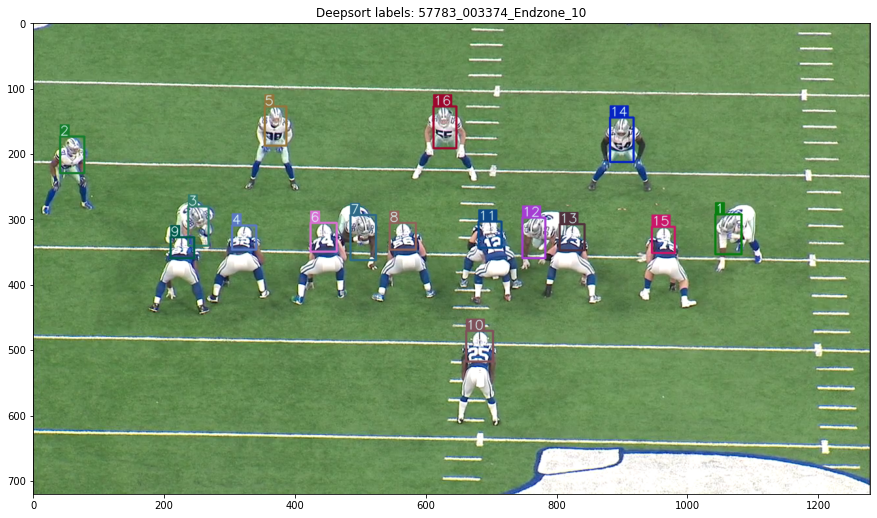

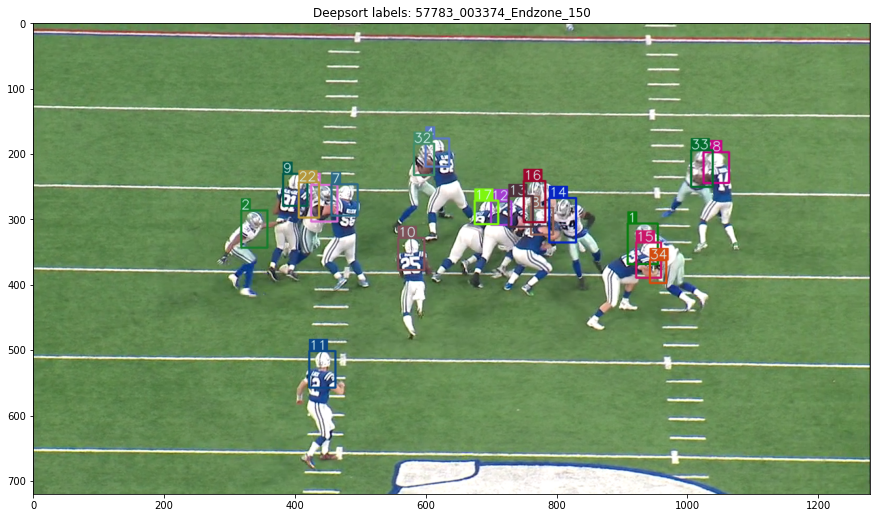

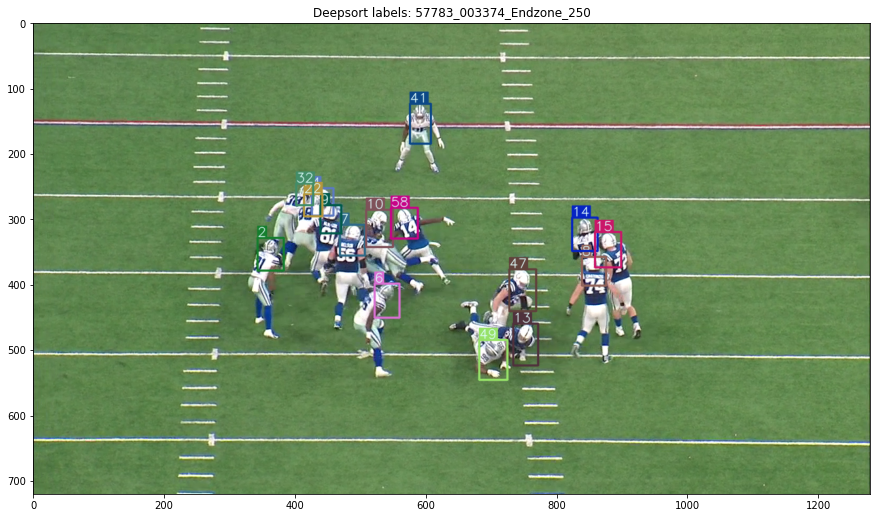

100%|██████████| 1/1 [00:47<00:00, 47.16s/it]

(7692, 23)
(7306, 23)
0.36826 before --> 0.81187 deepsort


In [26]:
# Add video and frame columns to submission.
submission_df['video'] = submission_df['video_frame'].str.split('_').str[:3].str.join('_')
submission_df['frame'] = submission_df['video_frame'].str.split('_').str[-1].astype('int')

if debug:
    video_dir = '../input/nfl-health-and-safety-helmet-assignment/train/'
else:
    video_dir = '../input/nfl-health-and-safety-helmet-assignment/test/'

# Loop through test videos and apply. If in debug mode show the score change.
outs = []
for myvideo, video_data in tqdm(submission_df.groupby('video'), total=submission_df['video'].nunique()):
    print(f'==== {myvideo} ====')
    if debug:
        # Plot deepsort labels when in debug mode.
        if(myvideo.split('_')[2]== 'Sideline'):
            out_player, out_helmet = deepsort(video_data, video_dir, view='Sideline', plot_frames=[10, 150, 250])
        else:
            out_player, out_helmet = deepsort(video_data, video_dir, view='Endzone', plot_frames=[10, 150, 250])
    else:
        if(myvideo.split('_')[2]== 'Sideline'):
            out_player, out_helmet = deepsort(video_data, video_dir, view='Sideline')
        else:
            out_player, out_helmet = deepsort(video_data, video_dir, view='Endzone')
    
    out_player = add_deepsort_label_col(out_player)
    
    out_helmet = add_deepsort_label_col(out_helmet)

    out = out_player
    outs.append(out)
    if debug:
        score_vs_deepsort(myvideo, out, labels)
submission_deepsort = pd.concat(outs).copy()

# Check Submission & Save
Finally we will create a submission file and check that it passes the submission requirements.
The steps are:
1. Drop the `label` and replace with `label_deepsort` predictions.
2. Remove any duplicate labels within a single video/frame. This is required to meet the submission requirements.
3. Save the results.

In [21]:
def fix_submission(sub):

    n_na = sub.isna().any(axis = 1).sum()
    if n_na:
        sub = sub.dropna()
        print(f'Dropped {n_na} lines from submission')

    n_dupe_labels = sub[["video_frame", "label"]].duplicated().sum()
    if n_dupe_labels:
        sub = sub.drop_duplicates(['video_frame', 'label'])
        print(f'Dropped {n_dupe_labels} duplicated labels')

    n_dupe_bbox = sub[["video_frame", "left", "width", "top", "height"]].duplicated().sum()
    if n_dupe_bbox:
        sub = sub.drop_duplicates(['video_frame', 'left','width','top','height'])
        print(f'Dropped {n_dupe_bbox} duplicated bboxes')

    n_over_22 = (sub.groupby(["video_frame"])["label"].count() > 22).sum()
    if n_over_22:
        sub = sub.groupby("video_frame").head(22)
        print(f'Dropped {n_over_22} extra bboxes')

    n_out_of_bounds = (
        (sub['left'] < 0) | 
        (sub['top'] < 0) | 
        ((sub['left'] + sub['width']) > 1280) |
        ((sub['top'] + sub['height']) > 720)
    ).sum()
    if n_out_of_bounds:
        sub['right'] = sub['left'] + sub['width']
        sub['bottom'] = sub['top'] + sub['height']

        sub['left'] = sub['left'].clip(0, 1280-1)
        sub['right'] = sub['right'].clip(1, 1280)
        sub['top'] = sub['top'].clip(0, 720-1)
        sub['bottom'] = sub['bottom'].clip(1, 720)

        sub['width'] = sub['right'] - sub['left']
        sub['height'] = sub['bottom'] - sub['top']
        sub = sub.drop(['bottom', 'right'], axis = 1)
        print(f'Clipped {n_out_of_bounds} bboxes')

    return sub


In [22]:
ss = pd.read_csv('../input/nfl-health-and-safety-helmet-assignment/sample_submission.csv')
# Final Checks
submission_deepsort['label_deepsort'] = submission_deepsort['label_deepsort'] \
    .fillna(submission_deepsort['label'])
submission_deepsort = submission_deepsort.drop('label', axis=1) \
    .rename(columns={'label_deepsort':'label'})[ss.columns]
# Drop duplicate labels
submission_deepsort = submission_deepsort.loc[
    ~submission_deepsort[['video_frame','label']].duplicated()]
check_submission(submission_deepsort)

submission_deepsort = fix_submission(submission_deepsort)
submission_deepsort.to_csv('submission.csv', index=False)

# Display video showing predictions

Lastly, if we want to review our predictions we can create a video to review the predictions using the `video_with_predictions` function from the `helmet_assignment` helper package.

In [23]:
from helmet_assignment.video import video_with_predictions
from IPython.display import Video, display

if debug:
    submission_deepsort['video'] = submission_deepsort['video_frame'].str.split('_').str[:3].str.join('_') + '.mp4'
    debug_videos = submission_deepsort['video'].unique()
    debug_labels = labels.query('video in @debug_videos')
    scorer = NFLAssignmentScorer(debug_labels)
    print(scorer.score(submission_deepsort))
    
    # Create video showing predictions for one of the videos.
    video_out = video_with_predictions(
        f'../input/nfl-health-and-safety-helmet-assignment/train/{debug_videos[0]}',
        scorer.sub_labels)
    
    frac = 0.60 # scaling factor for display
    display(Video(data=video_out,
                  embed=True,
                  height=int(720*frac),
                  width=int(1280*frac))
           )

0.8118692453057779
Running for 57783_003374_Endzone
